In [1]:
import os
import glob
import gc
import random

from pathlib import Path

import numpy as np
import pandas as pd
import h5py

from scipy.sparse import csr_matrix
from pathlib import Path

import scipy

from scipy.stats import median_abs_deviation, percentileofscore
from sklearn.metrics import silhouette_score, confusion_matrix
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import seaborn as sns

import anndata as ad
import scanpy.external as sce
import scanpy as sc

import pegasus as pg
from pegasusio import UnimodalData, MultimodalData
import scrublet as scr

from tqdm import tqdm

%matplotlib inline

sc.settings.n_jobs = 25

random.seed(0)
np.random.seed(0)
sc.settings.seed = 0

In [2]:
PURCELL_SRR_FOLDERS = glob.glob('/mnt/sdb/scz_meta_analysis_processed/purcell_mulle/star_outputs/*_Solo.out/')

In [3]:
## Import CellBendered Adata Object ##

purcell_adata = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/purcell_mulle/anndata_objs/purcell_cellbendered.h5ad')

purcell_adata.obs['barcodes'] = purcell_adata.obs_names

In [4]:
## Functions Iterate Through Folders And Build H5 ##

def assemble_library_annata(srr_folder):
    
    ''' takes the path to an SRR_Solo.out/ and generates the anndata object '''
    
    #raw_path = Path(srr_folder) / "Gene/raw"
    raw_path = Path(srr_folder) / "Gene/filtered"
    adata = sc.read_mtx(raw_path / "matrix.mtx").T
    adata.var = pd.read_csv(raw_path / "features.tsv", delimiter="\t", header=None, names=['gene_symbols', 'assay'])
    adata.obs = pd.read_csv(raw_path / "barcodes.tsv", header=None, index_col=0, names=['barcodes'])
    adata.obs_names = [srr_folder.split('/')[-2].split('_')[0] + '_' + obs_name for obs_name in adata.obs_names] 
    adata.obs['library'] = srr_folder.split('/')[-2].split('_')[0]
    
    return adata

def concatenate_libraries(srr_folder_list):

    library_list = []
    
    for srr_folder in tqdm(srr_folder_list):    
        library_list.append(assemble_library_annata(srr_folder))
        #print('Loaded {0}'.format(srr_folder.split('/')[-2].split('_')[0]))

    concatted = sc.concat(library_list, join='outer', label="library")
    concatted.var['feature_types'] = 'Gene Expression'
    
    return concatted

In [5]:
## Add Clinical Metadata ## 

# From original paper, and conversation with Ryan Purcell #

purcell_adata.obs['Sample'] = purcell_adata.obs_names.str.split('_').str[0]
purcell_adata.obs['Sample'] = purcell_adata.obs['Sample'].str.replace('C190D360', 'C190-D360')
purcell_adata.obs['Sample'] = purcell_adata.obs['Sample'].str.replace('C190', 'C19')

purcell_adata.obs['Donor'] = '9002-0031'
purcell_adata.obs['Day'] = purcell_adata.obs['Sample'].str.split('-').str[1].str.strip('D').astype('int')

purcell_adata.obs['Cell_Line'] = purcell_adata.obs['Sample'].str.split('-').str[0]
#purcell_adata.obs['Cell_Line'] = purcell_adata.obs['Cell_Line'].str.replace('C190', 'C19')

dx_dict = {'C19':'Control', 'C33':'Control', '3G2B': '3q29del', '11D7': '3q29del'}

purcell_adata.obs['Diagnosis'] = purcell_adata.obs['Cell_Line'].apply(lambda x: dx_dict[x])

sample_batch_dict =  {'3G2B-D360':'batch1', '3G2B-D50': 'batch1', 'C19-D50': 'batch1', 'C19-D360': 'batch1',
                      '11D7-D360':'batch2', '11D7-D50': 'batch2', 'C33-D360': 'batch2', 'C33-D50': 'batch2'}

purcell_adata.obs['batch'] = purcell_adata.obs['Sample'].apply(lambda x: sample_batch_dict[x])
purcell_adata.obs['Sex'] = 'F'

In [6]:
## Map NCBI Gene Names w/Prasanth's File ##

# load prasanth's annotation file
prasanth_annot = pd.read_csv('/home/deepak/datasets/annotations/all_genes_EnsemblInfo_104.csv')

# merge prasanth's gene info into the var dataframe
purcell_adata.var['ensembl_gene_id'] = purcell_adata.var.index

purcell_adata.var = purcell_adata.var.merge(prasanth_annot, left_on='ensembl_gene_id', right_on='ensembl_gene_id', how='left')
purcell_adata.var.chromosome_name = purcell_adata.var.chromosome_name.astype('str')

# fix gene name that is NaN
purcell_adata.var.loc[purcell_adata.var['hgnc_symbol'].isna(),'hgnc_symbol'] = purcell_adata.var.loc[purcell_adata.var['hgnc_symbol'].isna(),'ensembl_gene_id']

#reset the index as the hgnc_symbol
purcell_adata.var.index = purcell_adata.var['hgnc_symbol']
purcell_adata.var.index.name = None

#some ensembls map to same hgnc so we make them unique
purcell_adata.var_names_make_unique(join='#')

gc.collect()

/tmp/ipykernel_540617/265463551.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  prasanth_annot = pd.read_csv('/home/deepak/datasets/annotations/all_genes_EnsemblInfo_104.csv')


0

In [7]:
print(purcell_adata.obs.shape[0])
print(purcell_adata.obs['Sex'].value_counts())

## Note of of the Donor IDs don't have a Sex ##
# We will need to Impute Later ##

117152
Sex
F    117152
Name: count, dtype: int64


In [8]:
## Remove Duplicate Barcodes ##

print(purcell_adata.obs_names.duplicated(keep=False).any())
print(purcell_adata.var_names.duplicated(keep=False).any())

# None

False
False


In [9]:
## Set Up QC Metrics ##

# filter on robust genes
# annotate_robust_genes_scanpy(integrated, percent_cells=0.05)
pg.identify_robust_genes(purcell_adata, percent_cells=0.05)
purcell_adata = purcell_adata[:,purcell_adata.var['robust']].copy()
gc.collect()

# mitochondrial genes, "MT-" for human, "Mt-" for mouse
purcell_adata.var["mt"] = purcell_adata.var_names.str.startswith("MT-")
# ribosomal genes
purcell_adata.var["ribo"] = purcell_adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
purcell_adata.var["hb"] = purcell_adata.var_names.str.contains("^HB[^(P)]")

# add protein_coding genes
purcell_adata.var['protein_coding'] = purcell_adata.var['gene_biotype'].apply(lambda x: True if 'protein_coding' == x else False)
purcell_adata.var['protein_coding'] = purcell_adata.var['protein_coding'].astype('bool')

# define mitocarta_genes
mitocarta_df = pd.read_csv('/home/deepak/datasets/annotations/Human.MitoCarta3.0.csv')
purcell_adata.var['mitocarta'] = [True if x in list(mitocarta_df['Symbol']) else False for x in purcell_adata.var.index]

# define robust_protein_coding genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
purcell_adata.var['robust_protein_coding'] = purcell_adata.var['robust'] & purcell_adata.var['protein_coding']
purcell_adata.var.loc[purcell_adata.var.ribo, 'robust_protein_coding'] = False
purcell_adata.var.loc[purcell_adata.var.mt, 'robust_protein_coding'] = False
purcell_adata.var.loc[purcell_adata.var.mitocarta, 'robust_protein_coding'] = False

# define robust_protein_coding_autosome genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
purcell_adata.var['autosome'] = purcell_adata.var.chromosome_name.isin([str(i) for i in range(1,23)])
purcell_adata.var['robust_protein_coding_autosome'] = purcell_adata.var['robust_protein_coding'] & purcell_adata.var['autosome'] 

2026-02-11 19:20:45,151 - pegasus.tools.preprocessing - INFO - After filtration, 28632/33538 genes are kept. Among 28632 genes, 19444 genes are robust.
2026-02-11 19:20:45,152 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 1.01s.


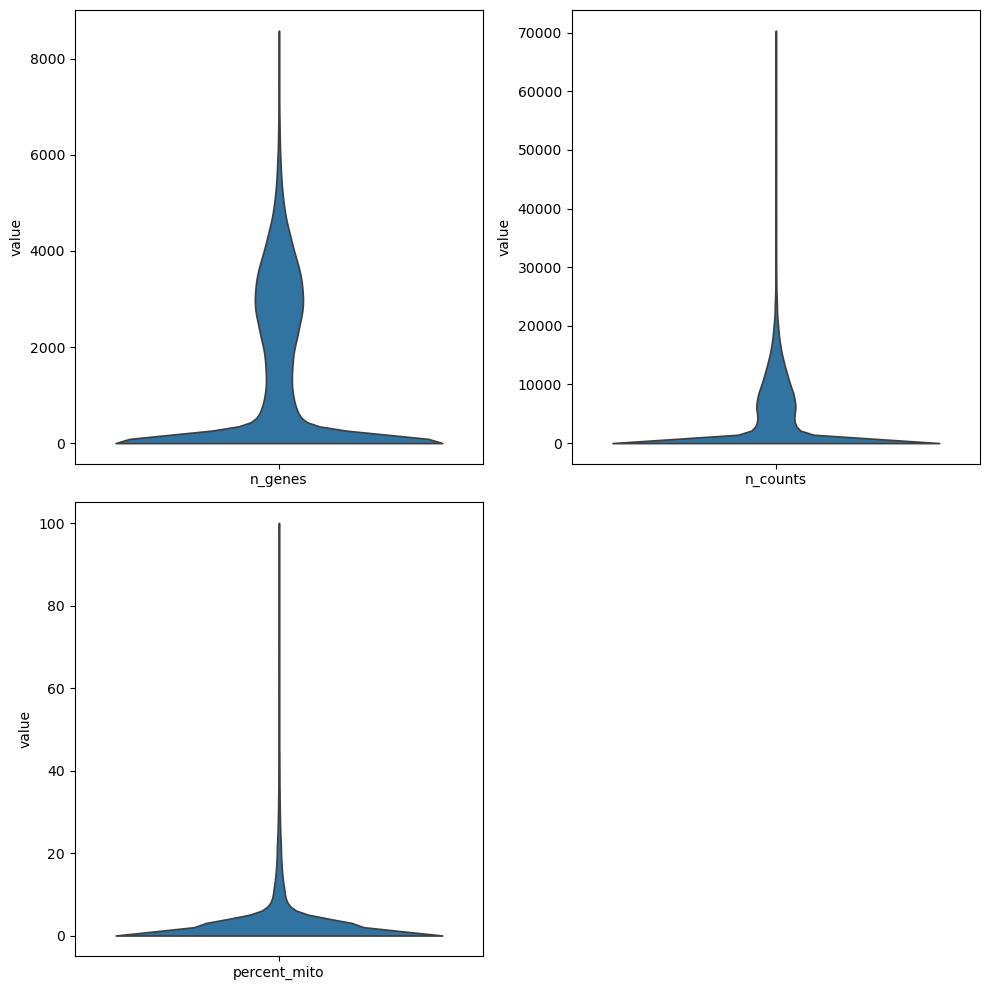

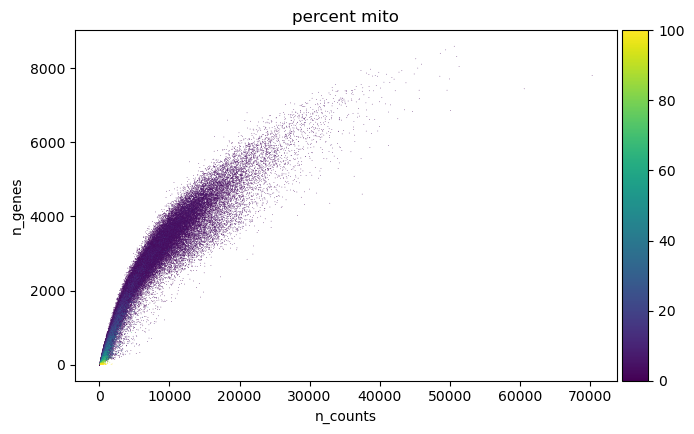

The 99th percentile all sample genes/cell is: 4404.449999999997
The 99th percentile all sample total counts/cell is: 15633.0
The 99th percentile all sample mitochondrial % /cell is: 16.68453779979865


In [10]:
## Plot QC Metrics ##

# QC by counts #
# convert to pegasus unimodal object
purcell_adata = UnimodalData(purcell_adata)
pg.qc_metrics(purcell_adata, mito_prefix='MT-')

# Create a figure with 3 subplots

# convert back for plotting to scanpy anndata
purcell_adata = purcell_adata.to_anndata()
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()
sc.pl.violin(purcell_adata, "n_genes", ax=axes[0], show=False, stripplot=False)
sc.pl.violin(purcell_adata, "n_counts", ax=axes[1], show=False, stripplot=False)
sc.pl.violin(purcell_adata, "percent_mito", ax=axes[2], show=False, stripplot=False)
fig.delaxes(axes[3])
plt.tight_layout()

sc.pl.scatter(purcell_adata, "n_counts", "n_genes", color="percent_mito")

print('The 99th percentile all sample genes/cell is: {0}'.format(np.percentile(purcell_adata.obs['n_genes'], 95)))

print('The 99th percentile all sample total counts/cell is: {0}'.format(np.percentile(purcell_adata.obs['n_counts'], 95)))

print('The 99th percentile all sample mitochondrial % /cell is: {0}'.format(np.percentile(purcell_adata.obs['percent_mito'], 95)))

n_UMIs lower: 1 upper: 1294389
n_genes lower: 1 upper: 187830


/home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


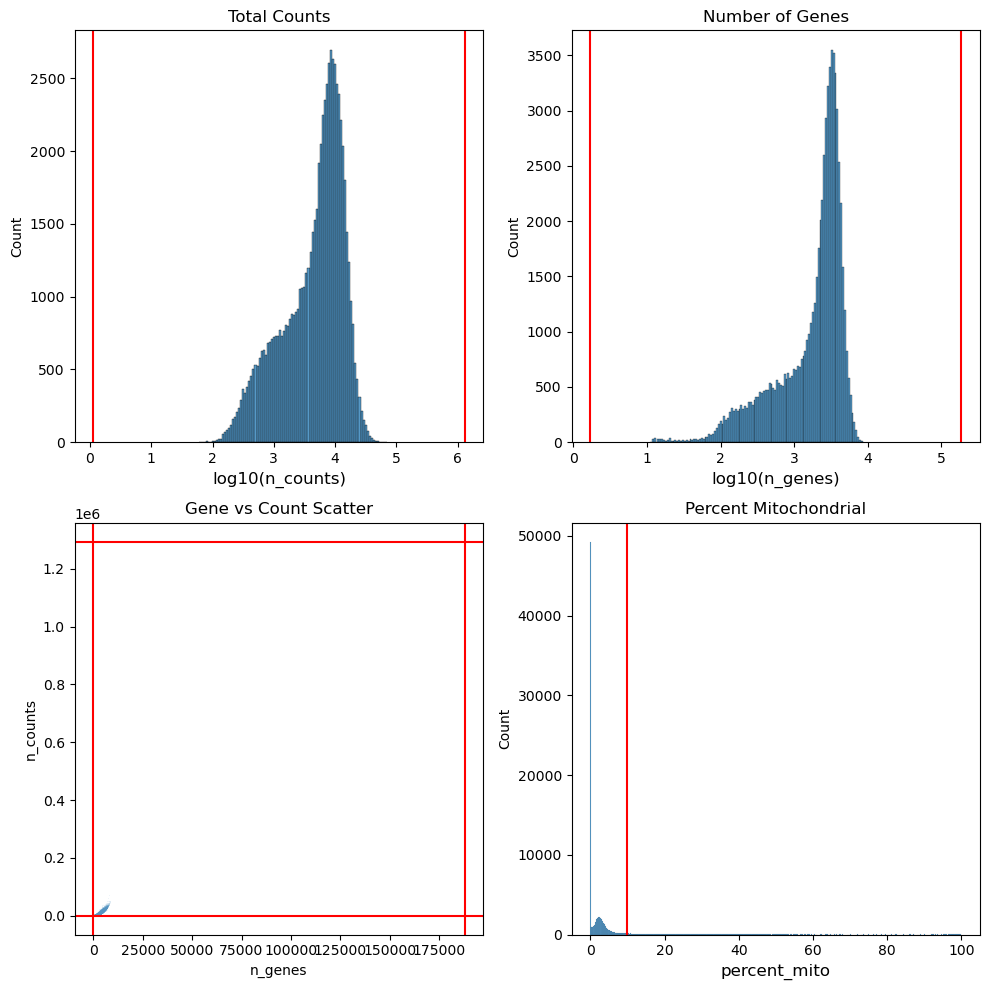

In [11]:
## Visualizating QC Cutoffs ##

MAD = 3

def qc_boundary(counts, k=MAD):
    x = np.log1p(counts)
    mad = median_abs_deviation(x)
    return np.exp(np.median(x) - k*mad), np.exp(np.median(x) + k*mad)

### nUMI and nGene QCs
n_counts_lower, n_counts_upper = qc_boundary(purcell_adata.obs.n_counts, k=MAD)
print('n_UMIs lower: %d upper: %d' % (n_counts_lower, n_counts_upper))

n_genes_lower, n_genes_upper = qc_boundary(purcell_adata.obs.n_genes, k=MAD)
print('n_genes lower: %d upper: %d' % (n_genes_lower, n_genes_upper))

## Plot Changes to Counts and Genes/Cell Distributions ##

fig, axs = plt.subplots(2, 2, figsize=(10, 10))  # 2x2 grid, adjust size as needed

# Plot 1: log10(n_counts)
sns.histplot(np.log10(purcell_adata.obs.n_counts), ax=axs[0, 0])
axs[0, 0].axvline(np.log10(n_counts_lower), color='red')
axs[0, 0].axvline(np.log10(n_counts_upper), color='red')
axs[0, 0].set_xlabel('log10(n_counts)', fontsize=12)
axs[0, 0].set_title("Total Counts")

# Plot 2: log10(n_genes)
sns.histplot(np.log10(purcell_adata.obs.n_genes), ax=axs[0, 1])
axs[0, 1].axvline(np.log10(n_genes_lower), color='red')
axs[0, 1].axvline(np.log10(n_genes_upper), color='red')
axs[0, 1].set_xlabel('log10(n_genes)', fontsize=12)
axs[0, 1].set_title("Number of Genes")

# Plot 3: scatter plot of n_genes vs n_counts
sns.scatterplot(x=purcell_adata.obs.n_genes, y=purcell_adata.obs.n_counts, alpha=0.5, s=0.1, ax=axs[1, 0])
axs[1, 0].axhline(n_counts_lower, color='red')
axs[1, 0].axhline(n_counts_upper, color='red')
axs[1, 0].axvline(n_genes_lower, color='red')
axs[1, 0].axvline(n_genes_upper, color='red')
axs[1, 0].set_xlabel('n_genes')
axs[1, 0].set_ylabel('n_counts')
axs[1, 0].set_title("Gene vs Count Scatter")

# Plot 4: percent_mito
sns.histplot(purcell_adata.obs.percent_mito, ax=axs[1, 1])
axs[1, 1].axvline(10, color='red')
axs[1, 1].set_xlabel('percent_mito', fontsize=12)
axs[1, 1].set_title("Percent Mitochondrial")

plt.tight_layout()
plt.show()

n_cells before QC: 117152
n_cells after QC: 117152
mean n_cells before QC 14644.0
mean n_cells after QC 14644.0


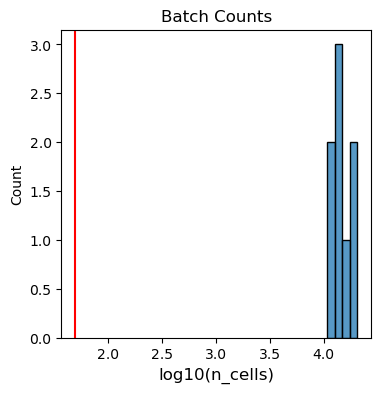

remove 0 batches that have cells less than 50


In [12]:
## Minimum Cell Cutoffs Based on Donor-Batches ##

args_min_n_cells = 50

n_cells_before_qc = purcell_adata.obs.library.value_counts().rename_axis('library').reset_index(name='counts')
n_cells_after_qc = purcell_adata.obs[purcell_adata.obs.passed_qc].library.value_counts().rename_axis('library').reset_index(name='counts')

print('n_cells before QC:', np.sum(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
print('n_cells after QC:', np.sum(n_cells_after_qc[n_cells_after_qc.counts>0].counts))

print('mean n_cells before QC', np.mean(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
print('mean n_cells after QC', np.mean(n_cells_after_qc[n_cells_after_qc.counts>0].counts))

# Plot Distribution of Donor-Batches on Being Greater than Zero
plt.figure(figsize=(4, 4))
plt.title('Batch Counts')
sns.histplot(np.log10(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
plt.axvline(np.log10(args_min_n_cells), color='red')
plt.xlabel('log10(n_cells)', fontsize=12)
plt.show()

### n_cells QC

#identify donor-batches with less than 50 cells of contribution
n_cells_outlier = list(n_cells_after_qc[n_cells_after_qc.counts<args_min_n_cells].library)
# set these to have failed QC as well
purcell_adata.obs.loc[purcell_adata.obs.library.isin(n_cells_outlier),'passed_qc'] = False
print('remove {0} batches that have cells less than {1}'.format(len(n_cells_outlier), args_min_n_cells))

In [13]:
purcell_adata.obs.columns

Index(['background_fraction', 'cell_probability', 'cell_size',
       'droplet_efficiency', 'library', 'nUMIs', 'cell', 'barcodes', 'Sample',
       'Donor', 'Day', 'Cell_Line', 'Diagnosis', 'batch', 'Sex', 'n_genes',
       'n_counts', 'percent_mito', 'passed_qc'],
      dtype='object')

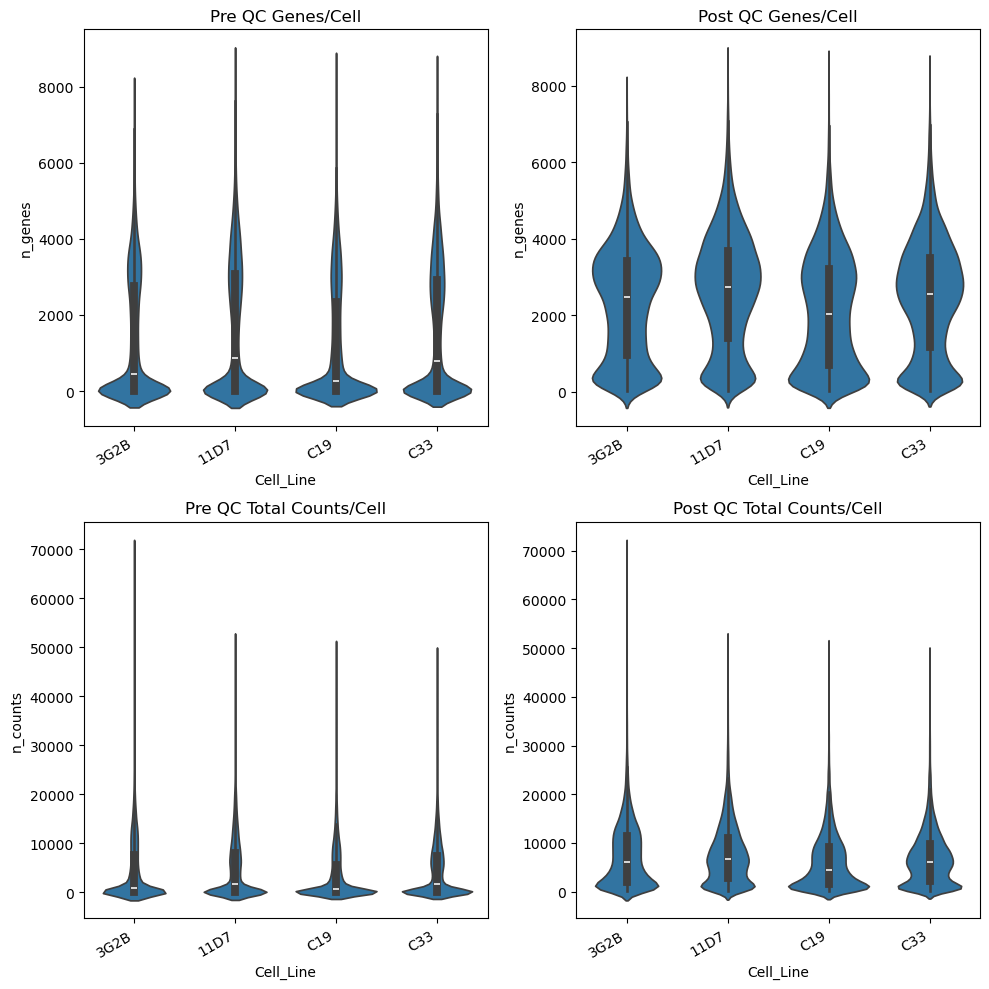

In [14]:
## Trialing QC Cutoffs Before and After ##

## Boolean Cutoffs for UMIs and Genes/Cell ##

counts_filter = (n_counts_lower < purcell_adata.obs.n_genes) & (purcell_adata.obs.n_genes < n_counts_upper)
genes_filter = (n_genes_lower < purcell_adata.obs.n_genes) & (purcell_adata.obs.n_genes < n_genes_upper)

# Plot Changes With Violins 

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()
sns.violinplot(data=purcell_adata.obs, y='n_genes', x='Cell_Line', ax=axes[0])
axes[0].set_title('Pre QC Genes/Cell')
plt.setp(axes[0].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=purcell_adata.obs[counts_filter & genes_filter], x='Cell_Line', y='n_genes', ax=axes[1])
axes[1].set_title('Post QC Genes/Cell')
plt.setp(axes[1].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=purcell_adata.obs, y='n_counts', x='Cell_Line', ax=axes[2])
axes[2].set_title('Pre QC Total Counts/Cell')
plt.setp(axes[2].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=purcell_adata.obs[purcell_adata.obs.passed_qc & genes_filter], x='Cell_Line', y='n_counts', ax=axes[3])
axes[3].set_title('Post QC Total Counts/Cell')
plt.setp(axes[3].get_xticklabels(), rotation=30, ha='right')

plt.tight_layout()
plt.show()

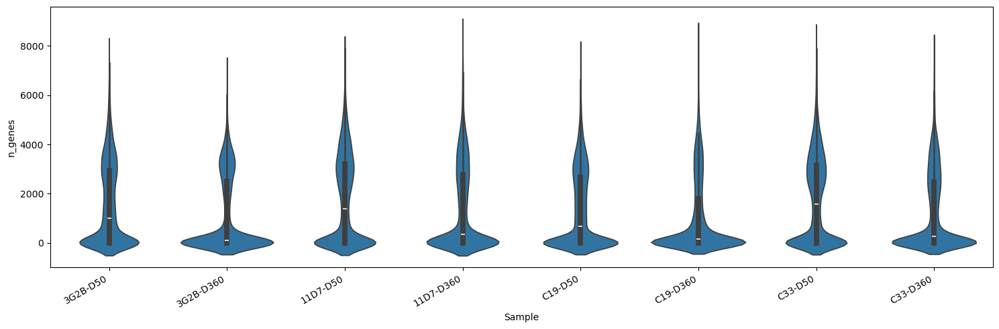

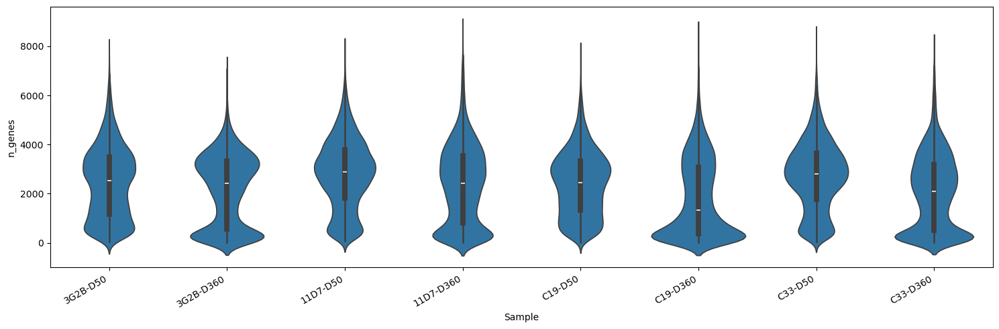

In [15]:
plt.figure(figsize=(15,5))
sns.violinplot(data=purcell_adata.obs, x='Sample', y='n_genes')
plt.xticks(rotation=30, ha='right')
plt.tight_layout()

plt.figure(figsize=(15,5))
sns.violinplot(data=purcell_adata.obs[counts_filter & genes_filter], x='Sample', y='n_genes')
plt.xticks(rotation=30, ha='right')
plt.tight_layout()

In [16]:
## Remove Cells That Don't Meet Total Counts/Cell and Genes/Cell Thresholds ##

purcell_adata = MultimodalData(UnimodalData(purcell_adata, modality="rna"))

pg.qc_metrics(purcell_adata, 
              min_genes=n_genes_lower, max_genes=n_genes_upper,
              min_umis=n_counts_lower, max_umis=n_counts_upper,
              mito_prefix='MT-', percent_mito=10)

pg.filter_data(purcell_adata)
gc.collect()
purcell_adata = purcell_adata.to_anndata()

2026-02-11 19:20:51,981 - pegasusio.qc_utils - INFO - After filtration, 59983 out of 117152 cell barcodes are kept in UnimodalData object unknown-rna.
2026-02-11 19:20:51,982 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 0.37s.


In [17]:
## Filter Cells and Genes With Raw Cutoffs #

# store raw counts in layer
purcell_adata.layers["raw_counts"] = purcell_adata.X

# Note: No cells fail this cutoff affter using MAD based filtration
print((purcell_adata.obs.n_genes < 100).sum())
print((purcell_adata.var.n_cells < 20).any())

# Doing This For Completeness
sc.pp.filter_cells(purcell_adata, min_genes=100)
sc.pp.filter_genes(purcell_adata, min_cells=20)

246
False


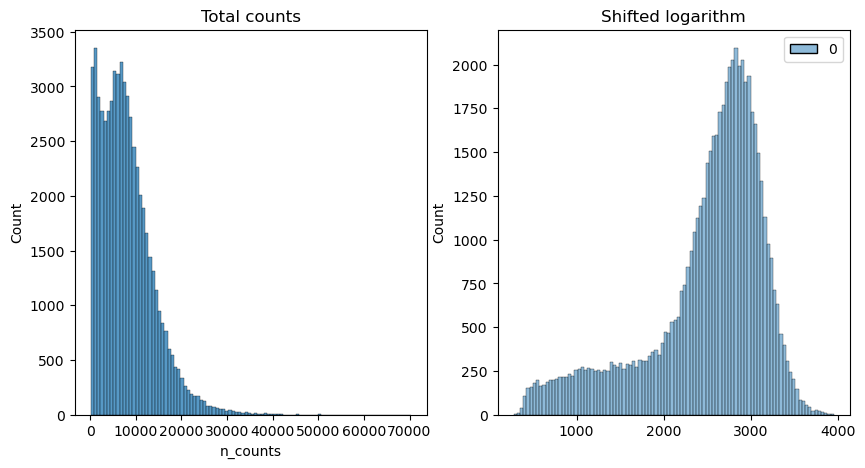

In [18]:
## Log Normalization ##

# normalize 
scales_counts = sc.pp.normalize_total(purcell_adata, layer='raw_counts', target_sum=None, inplace=False)

# log1p transform
purcell_adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

# set X as log1p normed counts
purcell_adata.X = purcell_adata.layers["log1p_norm"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(purcell_adata.obs["n_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(purcell_adata.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

2026-02-11 19:38:17,186 - pegasus.tools.utils - INFO - Loaded signatures from GMT file /home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/pegasus/data_files/cell_cycle_human.gmt.
2026-02-11 19:38:17,189 - pegasus.tools.signature_score - INFO - Signature G1/S: 43 out of 43 genes are used in signature score calculation.
2026-02-11 19:38:17,189 - pegasus.tools.signature_score - WARNING - Signature key G1/S exists in data.obs, the existing content will be overwritten!
2026-02-11 19:38:17,389 - pegasus.tools.signature_score - INFO - Signature G2/M: 54 out of 54 genes are used in signature score calculation.
2026-02-11 19:38:17,389 - pegasus.tools.signature_score - WARNING - Signature key G2/M exists in data.obs, the existing content will be overwritten!
2026-02-11 19:38:17,601 - pegasus.tools.signature_score - INFO - Function 'calc_signature_score' finished in 0.42s.
2026-02-11 19:38:23,709 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 2.48s.


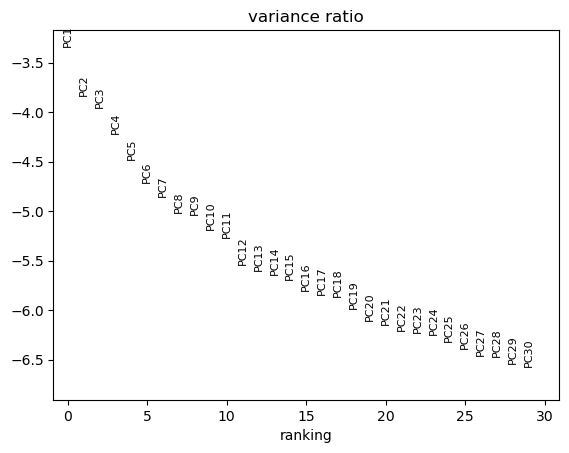

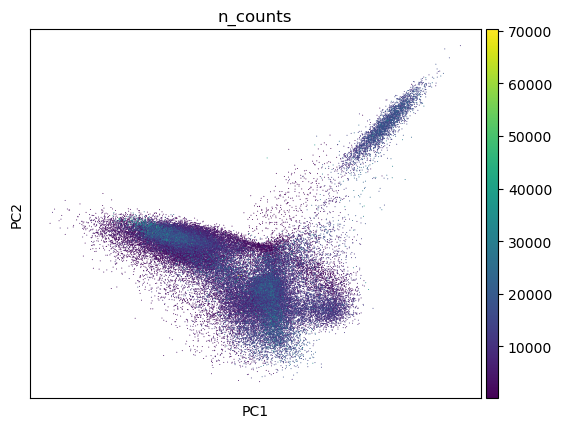

There is 18.828233359506985 variance explained by these components
2026-02-11 19:38:24,106 - pegasus.tools.preprocessing - INFO - Function 'regress_out' finished in 0.07s.
2026-02-11 19:38:24,106 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 20 iteration(s).
	Completed 2 / 20 iteration(s).
	Completed 3 / 20 iteration(s).
	Completed 4 / 20 iteration(s).
	Completed 5 / 20 iteration(s).
Reach convergence after 5 iteration(s).
2026-02-11 19:38:33,664 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 9.56s.
2026-02-11 19:38:37,701 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 4.04s.
2026-02-11 19:38:38,618 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 0.92s.
2026-02-11 19:38:39,725 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 1.11s.
2026-02-11 19:38:46,379 - pegasus.tools.clust

/home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Wed Feb 11 19:39:05 2026 Finished embedding
2026-02-11 19:39:05,914 - pegasus.tools.visualization - INFO - Function 'umap' finished in 19.50s.


In [33]:
# Calculate Highly Variable Genes (not using deviance) ##

if not isinstance(purcell_adata, UnimodalData):
    purcell_adata = UnimodalData(purcell_adata)

## ROUND 0 ##

# calc score requires a float downcast for some reason
purcell_adata.X = purcell_adata.X.astype('float32')
pg.calc_signature_score(purcell_adata, 'cell_cycle_human')

# calculate HVGs on a protein_coding_autosomal only gene list
purcell_hvg = purcell_adata[:,purcell_adata.var.robust_protein_coding_autosome].copy()
purcell_hvg = purcell_hvg.to_anndata()
hvg = sc.pp.highly_variable_genes(purcell_hvg, layer='log1p_norm', n_top_genes=3000, inplace=False, subset=False)
hvg_list = purcell_hvg.var.index[hvg.highly_variable].tolist()
del purcell_hvg
gc.collect()

# apply that HVG list to your original anndata object
purcell_adata.var['highly_variable_features'] = False
purcell_adata.var['highly_variable_features'] = purcell_adata.var.index.isin(hvg_list)

## Dimensionality Reduction ##

# PCA

if not isinstance(purcell_adata, UnimodalData):
    purcell_adata = UnimodalData(purcell_adata)

pg.pca(purcell_adata, n_components=30)
sc.pl.pca_variance_ratio(purcell_adata, n_pcs=30, log=True)
sc.pl.pca_scatter(purcell_adata.to_anndata(), color="n_counts")
plt.show()

print('There is {0} variance explained by these components'.format(purcell_adata.uns['pca']['variance_ratio'].sum()*100))

# # Regress Out ##

pg.regress_out(purcell_adata, ['n_counts', 'percent_mito'])

## Harmony  

pg.run_harmony(purcell_adata, batch=['Cell_Line'], rep='pca_regressed', max_iter_harmony=20, n_comps=30)

# # UMAP

pg.neighbors(purcell_adata, rep='pca_regressed_harmony', use_cache=False, dist='l2', K=100, n_comps=30)
pg.leiden(purcell_adata, rep='pca_regressed_harmony', resolution=0.1, class_label='class')
pg.umap(purcell_adata, rep='pca_regressed_harmony', n_neighbors=15, rep_ncomps=30)
plt.show()

purcell_adata = purcell_adata.to_anndata()

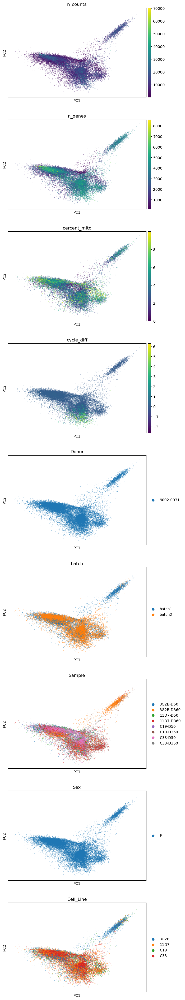

In [34]:
sc.pl.pca(purcell_adata, color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 
                                'batch', 'Sample', 'Sex', 'Cell_Line'], ncols=1)

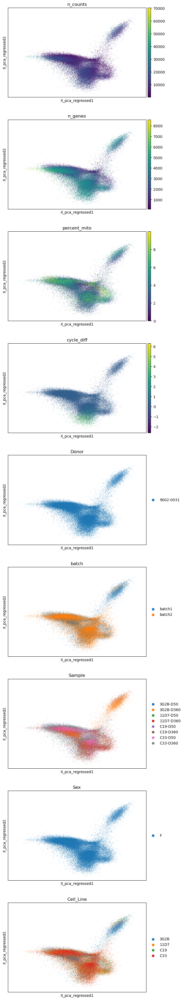

In [35]:
sc.pl.embedding(purcell_adata, basis='X_pca_regressed', 
                color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 
                       'batch', 'Sample', 'Sex', 'Cell_Line'], ncols=1)

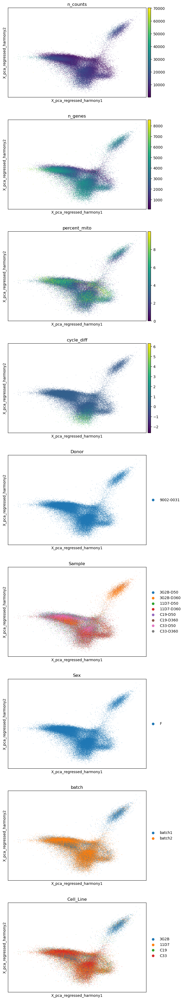

In [36]:
sc.pl.embedding(purcell_adata, basis='X_pca_regressed_harmony', 
                color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 
                       'Sample', 'Sex', 'batch', 'Cell_Line'], ncols=1)

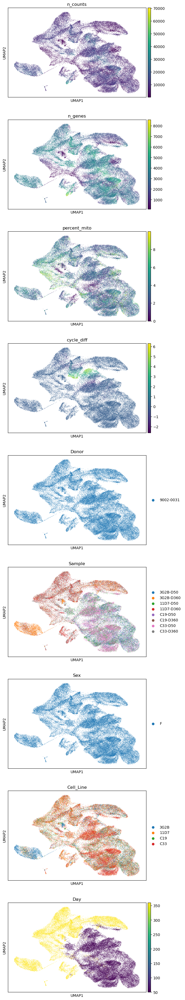

In [37]:
sc.pl.umap(purcell_adata, color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 
                                 'Sample', 'Sex', 'Cell_Line', 'Day'], ncols=1)

In [38]:
## Save Step ##

purcell_adata.write_h5ad(os.path.join('/mnt/sdb/scz_meta_analysis_processed/purcell_mulle/anndata_objs/purcell_qc.h5ad'))

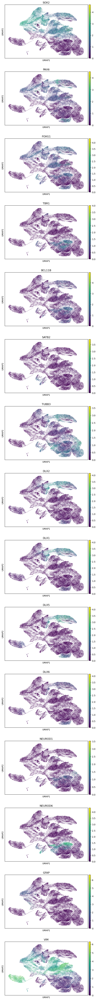

In [39]:
sc.pl.umap(purcell_adata, color=["SOX2", "PAX6", "FOXG1", 'TBR1', 'BCL11B', 'SATB2', 
                                 'TUBB3', 'DLX2', 'DLX1', 'DLX5', 'DLX6', 'NEUROD1', 'NEUROD6', 'GFAP', 'VIM'], ncols=1)